In [1]:
#IMPORT ITENS E DEFINE CODIGO PARA FUNCIONAR CNN
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "1"

# GPU DESATIVADA
#os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# GPU ATIVA
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"

In [2]:
import tensorflow as tf
import numpy as np
import pandas as pd
import cv2 as cv
from matplotlib import pyplot as plt
from tensorflow.keras.datasets import mnist
from tensorflow.keras import layers
from tensorflow.keras import models 
from tensorflow.keras.utils import to_categorical
from numpy import argmax
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
import sklearn.metrics as metrics

from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import decode_predictions
from tensorflow.keras.applications.vgg16 import VGG16

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import time

import pandas as pd
import cv2 as cv
import numpy as np
import imutils
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import pickle

In [2]:
!ls figs

11.jpg
baby.png
blobs.png
cinza.jpg
cinzaout.jpg
degrade.png
hero.png
HubIA_Poligonos_data_cultura.csv
imgTeste.jpg
JP2.jpg
JP.jpeg
j.png
logo.png
messi5.jpg
noisy.jpg
simpsons.png
sudoku.jpg
tetris.png
young-woman-with-beautiful-face_144962-1856.jpg


# Execicio 1
    * Abra a imagem figs/messi5.jpg
    * Recorte a bola
    * Copie em outra parte da imagem
    * Rotacione a imagem em 60 graus
    * Altere o tamanho da imagem mantendo a proporção

## Abra a imagem figs/messi5.jpg

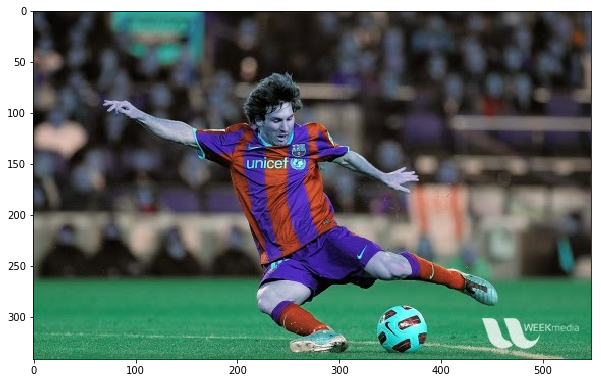

In [3]:
img = cv.imread("./figs/messi5.jpg")
figure(figsize=(10,10))
plt.imshow(img)

## Circula a bola

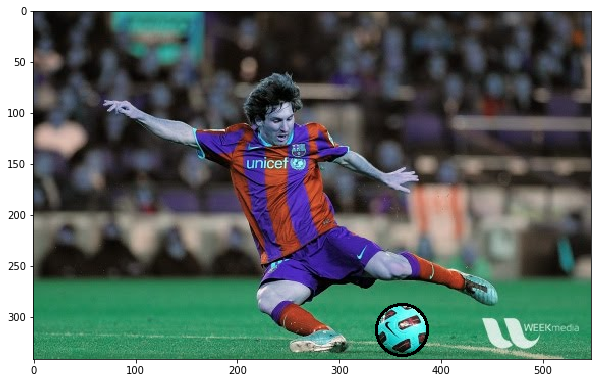

In [4]:
figure(figsize=(10,10))

X = 362
Y = 313
R = 25

bolaRecorte = cv.circle(img.copy(), (X,Y), R, (0,0,0), 2)

plt.imshow(bolaRecorte)

## Recorta a Bola

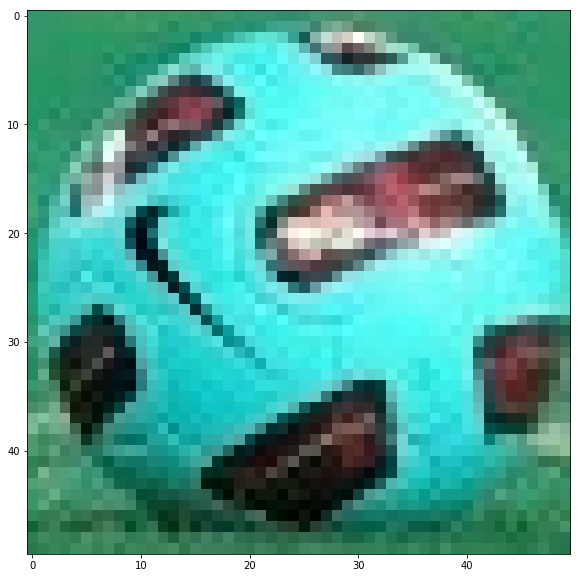

In [5]:
figure(figsize=(10,10))

somenteBola = img[Y-R:Y+R, X-R:X+R]
plt.imshow(somenteBola)

## Copie em outra parte da imagem

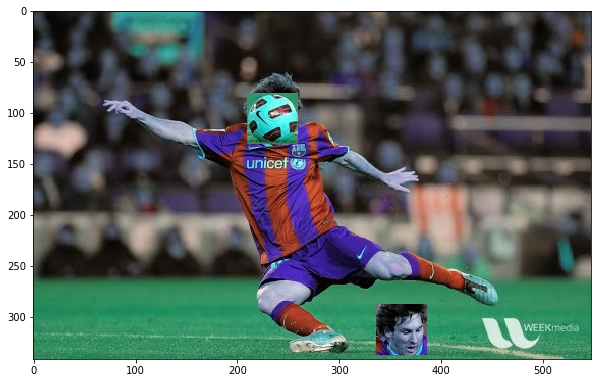

In [6]:
figure(figsize=(10,10))

xCabeca = 81
yCabeca = 210

bola = img[Y-R:Y+R, X-R:X+R]
cabeca = img[xCabeca:xCabeca+(R*2), yCabeca:yCabeca+(R*2)]

trocaImage = img.copy()
trocaImage[xCabeca:xCabeca+(R*2), yCabeca:yCabeca+(R*2)] = bola
trocaImage[Y-R:Y+R, X-R:X+R] = cabeca

plt.imshow(trocaImage)

## Rotacione a imagem em 60 graus

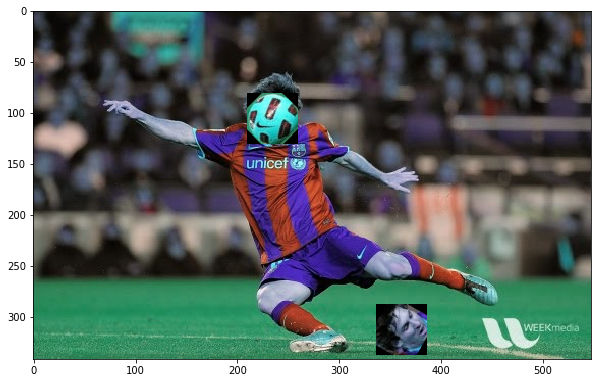

In [7]:
figure(figsize=(10,10))

trocaImage = img.copy()
trocaImage[xCabeca:xCabeca+(R*2), yCabeca:yCabeca+(R*2)] = imutils.rotate(bola, 45)
trocaImage[Y-R:Y+R, X-R:X+R] = imutils.rotate(cabeca, 60)

plt.imshow(trocaImage)

## Altere o tamanho da imagem mantendo a proporção

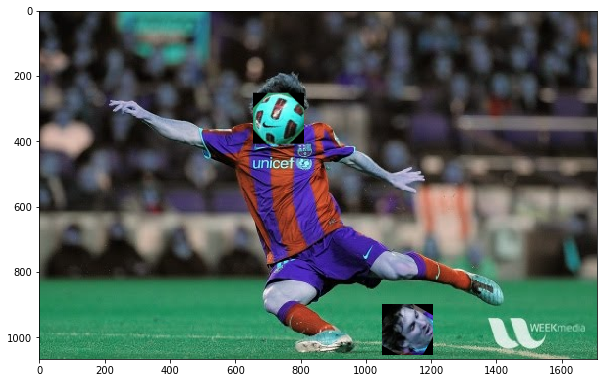

In [8]:
figure(figsize=(10,10))

multiplicador = 5
newImage = imutils.resize(trocaImage, width=(trocaImage.shape[0] * multiplicador))
plt.imshow(newImage)

# Execicio 2
    * Avalie o uso de filtros para eliminar ruídos e detectar contornos na imagem figs/11.jpg
    * Utilize os padrões definidos em https://github.com/opencv/opencv/tree/master/data/haarcascades para criar dois classificadores, teste os classificadores com imagens aleatórias

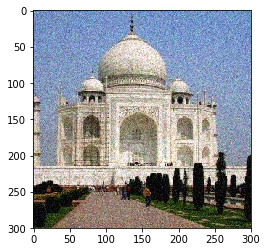

In [9]:
imgOriginal = cv.imread("./figs/11.jpg", cv.IMREAD_UNCHANGED)
imgFilters = cv.cvtColor(imgOriginal, cv.COLOR_BGR2RGB)
plt.imshow(imgFilters)

# Filtros Blur - Diferentes Valores

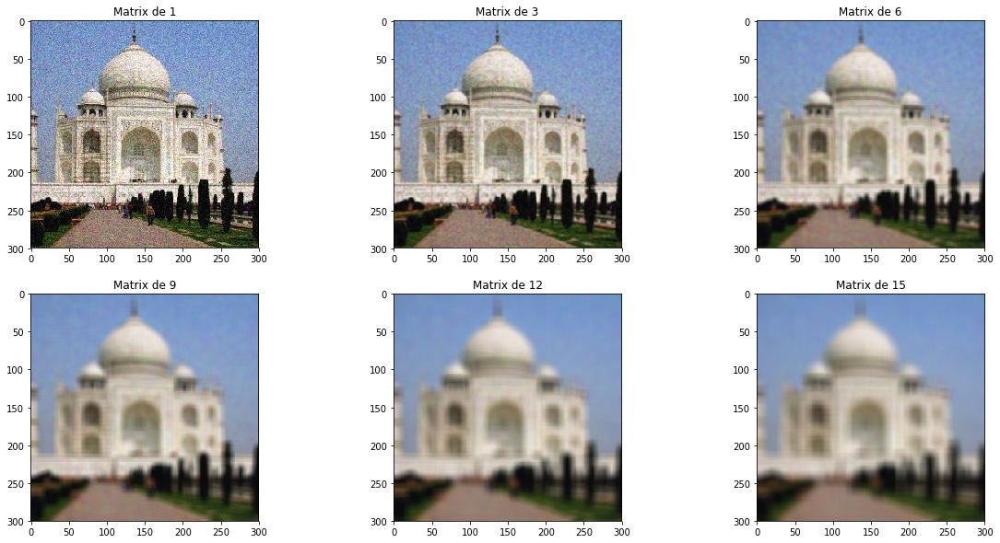

In [10]:
blurs = [1,3,6,9,12,15]
linhas = 2
colunas = 3

fig = plt.figure(figsize=(20, 10))
for i, val in enumerate(blurs):
    plt.subplot(linhas, colunas, i+1)
    img = cv.blur(imgFilters.copy(), (val, val))
    plt.imshow(img)
    plt.title("Matrix de {}" . format(val))
    #plt.xticks([]),plt.yticks([])
plt.show()

# Thresholds

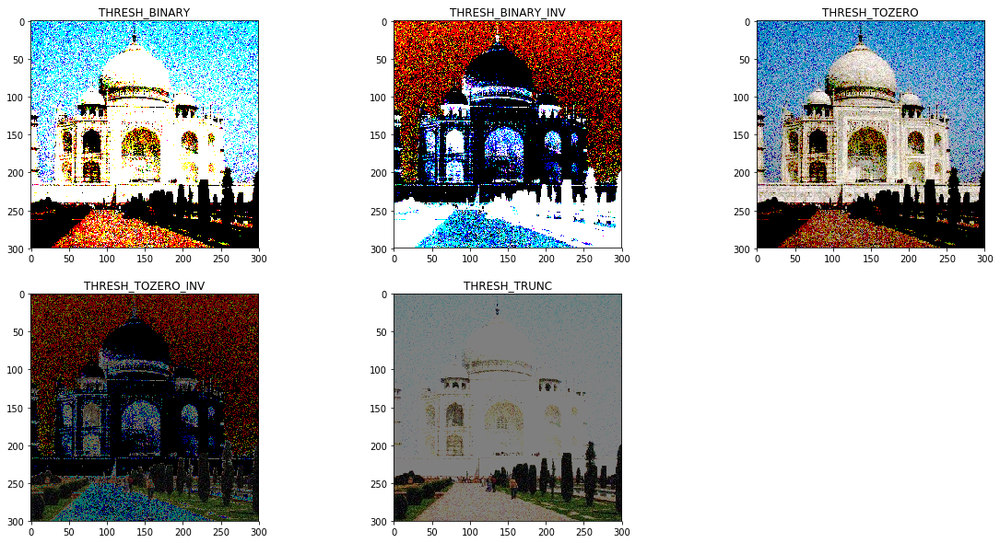

In [11]:
thresholds = [cv.THRESH_BINARY, cv.THRESH_BINARY_INV, cv.THRESH_TOZERO, cv.THRESH_TOZERO_INV, cv.THRESH_TRUNC]
thresholdsNome = ["THRESH_BINARY", "THRESH_BINARY_INV", "THRESH_TOZERO", "THRESH_TOZERO_INV", "THRESH_TRUNC"]
linhas = 2
colunas = 3
fig = plt.figure(figsize=(20, 10))
for i in range(1, (len(thresholds)) + 1):
    plt.subplot(linhas, colunas, i)
    _, thresh = cv.threshold(imgFilters.copy(), 127, 255, thresholds[i-1])
    plt.imshow(thresh)
    plt.title(thresholdsNome[i-1])
    #plt.xticks([]),plt.yticks([])
plt.show()

# Thresholds Grayscale

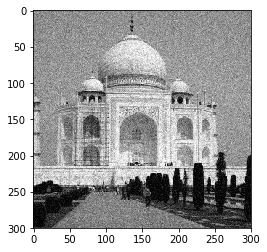

In [12]:
imgGray = cv.cvtColor(imgOriginal, cv.COLOR_BGR2GRAY)
plt.imshow(imgGray, cmap="gray")

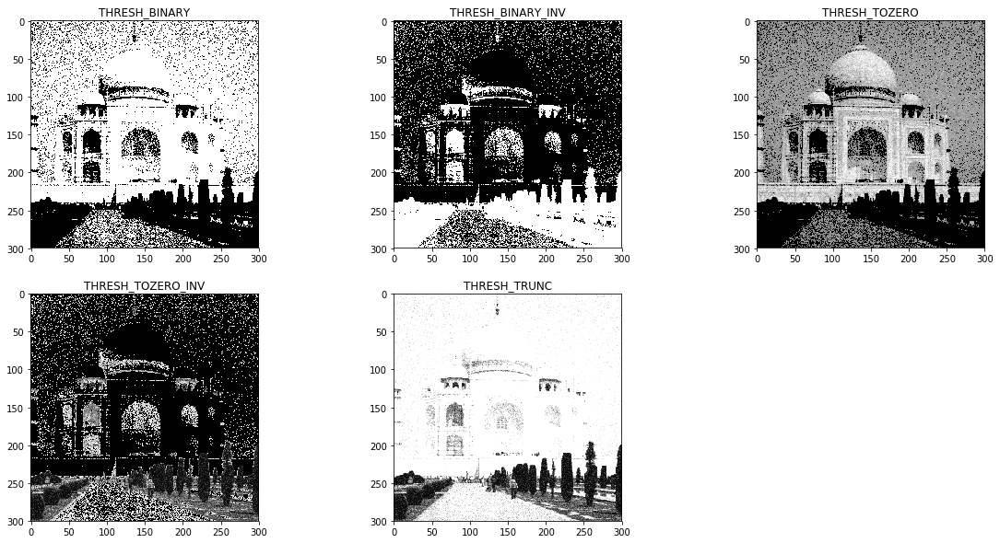

In [13]:
thresholds = [cv.THRESH_BINARY, cv.THRESH_BINARY_INV, cv.THRESH_TOZERO, cv.THRESH_TOZERO_INV, cv.THRESH_TRUNC]
thresholdsNome = ["THRESH_BINARY", "THRESH_BINARY_INV", "THRESH_TOZERO", "THRESH_TOZERO_INV", "THRESH_TRUNC"]
linhas = 2
colunas = 3
fig = plt.figure(figsize=(20, 10))
for i in range(1, (len(thresholds)) + 1):
    plt.subplot(linhas, colunas, i)
    _, thresh = cv.threshold(imgGray.copy(), 127, 255, thresholds[i-1])
    plt.imshow(thresh, cmap="gray")
    plt.title(thresholdsNome[i-1])
    #plt.xticks([]),plt.yticks([])
plt.show()

# Threshold Adaptativo

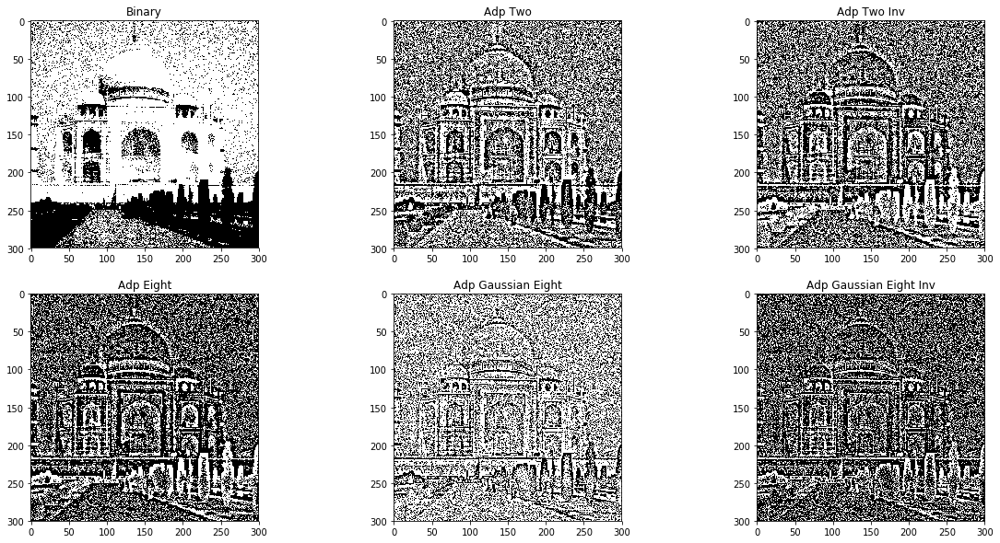

In [14]:
_, binTreshold = cv.threshold(imgGray.copy(), 127, 255, cv.THRESH_BINARY)
adpTwo = cv.adaptiveThreshold(imgGray.copy(), 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 11,2)
adpTwo_inv = cv.adaptiveThreshold(imgGray.copy(), 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY_INV, 11,2)
adpEight = cv.adaptiveThreshold(imgGray.copy(), 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY_INV, 11,8)
adpGaussian = cv.adaptiveThreshold(imgGray.copy(), 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 11,8)
adpGaussian_inv = cv.adaptiveThreshold(imgGray.copy(), 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, 11,8)

arrayImgs = [binTreshold, adpTwo, adpTwo_inv, adpEight, adpGaussian, adpGaussian_inv]
legendas = ["Binary", "Adp Two", "Adp Two Inv", "Adp Eight", "Adp Gaussian Eight", "Adp Gaussian Eight Inv"]

linhas = 2
colunas = 3
fig = plt.figure(figsize=(20, 10))
for i in range(1, (len(arrayImgs)) + 1):
    plt.subplot(linhas, colunas, i)
    plt.imshow(arrayImgs[i-1], cmap="gray")
    plt.title(legendas[i-1])
    #plt.xticks([]),plt.yticks([])
plt.show()

# Detectando bordas

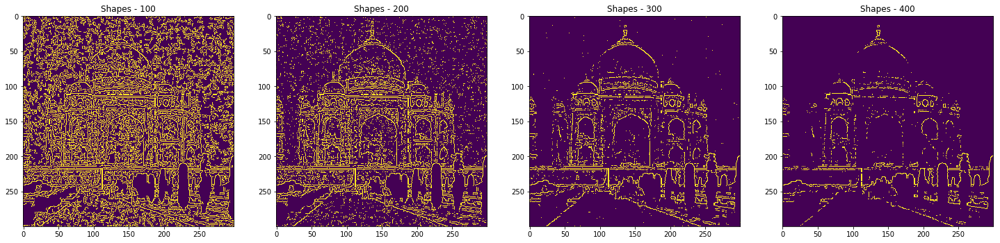

In [15]:
edge_1 = cv.Canny(imgOriginal, 100,200)
edge_2 = cv.Canny(imgOriginal, 200,200)
edge_3 = cv.Canny(imgOriginal, 300,300)
edge_4 = cv.Canny(imgOriginal, 400,400)

arrayEdges = (edge_1, edge_2, edge_3, edge_4)

linhas = 1
colunas = 4
fig = plt.figure(figsize=(25,10))
for i in range(len(arrayEdges)):
    plt.subplot(linhas, colunas, i+1)
    plt.imshow(arrayEdges[i])
    plt.title("Shapes - {}" . format(str((i+1) * 100)))
plt.show()

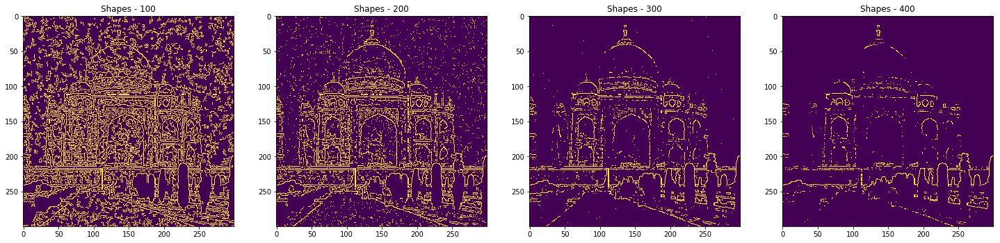

In [16]:
edge_1 = cv.Canny(imgGray, 100,200)
edge_2 = cv.Canny(imgGray, 200,200)
edge_3 = cv.Canny(imgGray, 300,300)
edge_4 = cv.Canny(imgGray, 400,400)

arrayEdges = (edge_1, edge_2, edge_3, edge_4)

linhas = 1
colunas = 4
fig = plt.figure(figsize=(25,10))
for i in range(len(arrayEdges)):
    plt.subplot(linhas, colunas, i+1)
    plt.imshow(arrayEdges[i])
    plt.title("Shapes - {}" . format(str((i+1) * 100)))
plt.show()

# Classificadores

## Eye detection

In [17]:
eyeDetection = cv.CascadeClassifier("./haarcascade_eye.xml")

def detectEye(img):
    rectEye = eyeDetection.detectMultiScale(img, scaleFactor = 1.1, minNeighbors = 7)
    if (len(rectEye)):
        for (x, y, w, h) in rectEye:
            cv.rectangle(img, (x,y), (x+w , y+h), (255,255,255), 2)
    
    return img

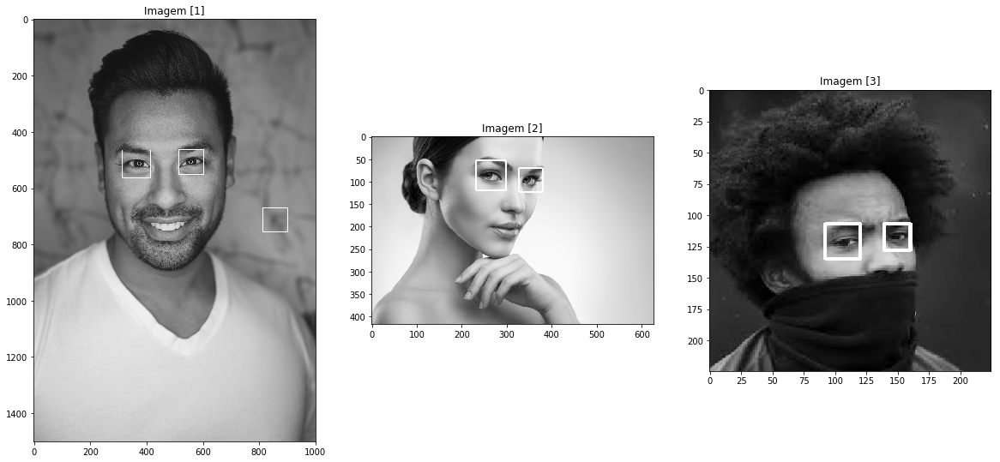

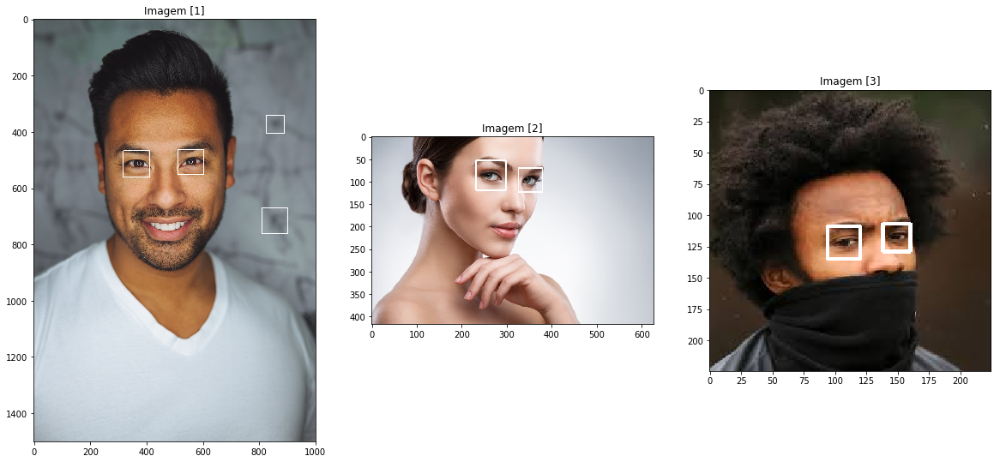

In [18]:
firstImage = cv.imread("./rosto_1.jpg")
secondImage = cv.imread("./rosto_2.jpg")
thirdImage = cv.imread("./rosto_3.jpg")
fiGray = cv.cvtColor(firstImage, cv.COLOR_BGR2GRAY)
siGray = cv.cvtColor(secondImage, cv.COLOR_BGR2GRAY)
tiGray = cv.cvtColor(thirdImage, cv.COLOR_BGR2GRAY)

arrayImagesDetectionGray = (fiGray, siGray, tiGray)

linhas = 1
colunas = 3
fig = plt.figure(figsize=(20,10))
for i in range(len(arrayImagesDetectionGray)):
    plt.subplot(linhas, colunas, i+1)
    plt.imshow(detectEye(arrayImagesDetectionGray[i]), cmap="gray")
    plt.title("Imagem {}" . format([i+1]))
plt.show()


fi = cv.cvtColor(firstImage, cv.COLOR_BGR2RGB)
si = cv.cvtColor(secondImage, cv.COLOR_BGR2RGB)
ti = cv.cvtColor(thirdImage, cv.COLOR_BGR2RGB)
arrayImagesDetection = (fi, si, ti)

linhas = 1
colunas = 3
fig = plt.figure(figsize=(20,10))
for i in range(len(arrayImagesDetection)):
    plt.subplot(linhas, colunas, i+1)
    plt.imshow(detectEye(arrayImagesDetection[i]))
    plt.title("Imagem {}" . format([i+1]))
plt.show()

## Face Detection

In [23]:
def detectFace(img):
    fontalFace = cv.CascadeClassifier("./haarcascade_frontalface_default.xml")
    #fontalFace = cv.CascadeClassifier("./haarcascade_frontalface_alt2.xml")
    rectFace = fontalFace.detectMultiScale(img, scaleFactor = 1.1, minNeighbors = 3)
    if (len(rectFace)):
        for (x, y, w, h) in rectFace:
            cv.rectangle(img, (x,y), (x+w , y+h), (255,255,255), 2)
    
    return img

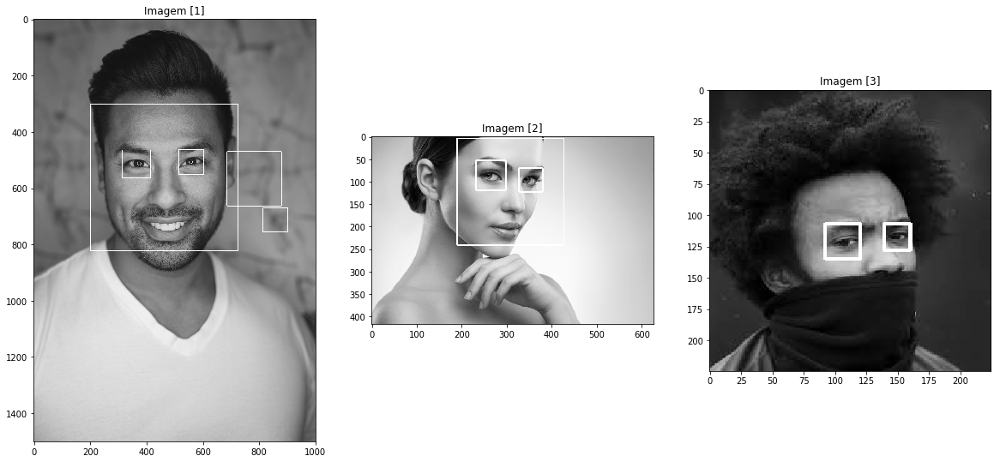

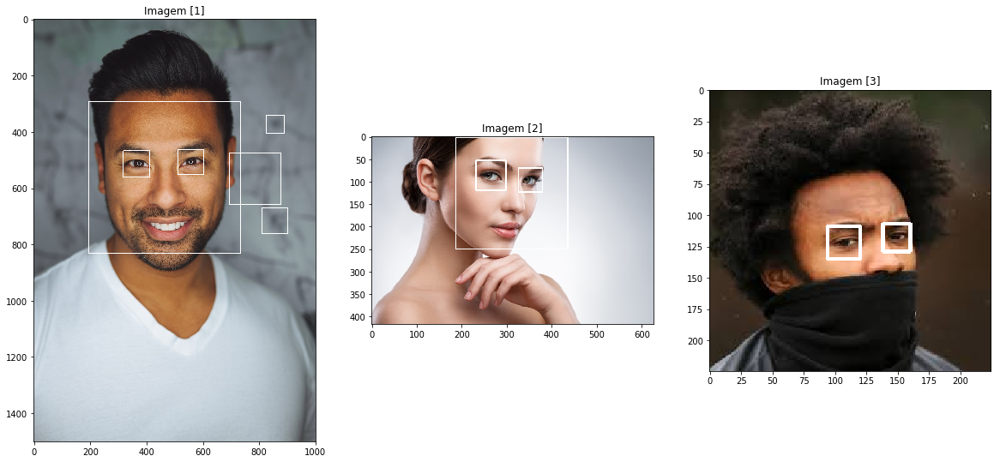

In [24]:
linhas = 1
colunas = 3
fig = plt.figure(figsize=(20,10))
for i in range(len(arrayImagesDetectionGray)):
    plt.subplot(linhas, colunas, i+1)
    plt.imshow(detectFace(arrayImagesDetectionGray[i]), cmap="gray")
    plt.title("Imagem {}" . format([i+1]))
plt.show()

linhas = 1
colunas = 3
fig = plt.figure(figsize=(20,10))
for i in range(len(arrayImagesDetection)):
    plt.subplot(linhas, colunas, i+1)
    plt.imshow(detectFace(arrayImagesDetection[i]))
    plt.title("Imagem {}" . format([i+1]))
plt.show()

# Exercicio 3
* Montar o ambiente para executar tensorflow com gpu (tensorflow-gpu)
* Executar código do mnist
* Fazer teste com uma rede treinada (VGG16)
* Utilizar a mesma topologia de rede neural usada para o problema minist, aplicando para o problema das abelhas
* Compare o tempo de treino da rede neural CNN usando CPUxGPU

## Ambiente configurado

## MNIST Codigo

In [26]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

In [27]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(60000, 28, 28)
(60000,)
(10000, 28, 28)
(10000,)


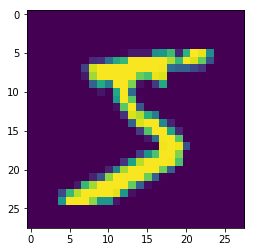

In [28]:
plt.imshow(X_train[0])

In [29]:
X_train = X_train.reshape((len(X_train), 28, 28, 1))
X_test = X_test.reshape((len(X_test), 28, 28, 1))

outputNumbers = list(set(y_test))

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

In [30]:
X_train = X_train / 255
X_test = X_test / 255

In [31]:
print(y_train)
print(y_test)
print(X_train.shape)
print(X_test.shape)

[[0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]]
[[0. 0. 0. ... 1. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(60000, 28, 28, 1)
(10000, 28, 28, 1)


## Modelo CNN MNIST

In [32]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), activation = "relu", input_shape=(28,28,1)))
model.add(layers.MaxPooling2D((2,2)))

# Adicionar Achatamento
model.add(layers.Flatten())
model.add(layers.Dense(10, activation = "softmax"))

In [33]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 5408)              0         
_________________________________________________________________
dense (Dense)                (None, 10)                54090     
Total params: 54,410
Trainable params: 54,410
Non-trainable params: 0
_________________________________________________________________


In [34]:
model.compile(optimizer = "rmsprop", loss = "categorical_crossentropy", metrics = ["acc"])

In [35]:
hist = model.fit(X_train, y_train, epochs = 10, batch_size = 128)

Train on 60000 samples
Epoch 1/10
60000/60000 [==============================] - 4s 63us/sample - loss: 0.3325 - acc: 0.9081
Epoch 2/10
60000/60000 [==============================] - 1s 24us/sample - loss: 0.1281 - acc: 0.9640
Epoch 3/10
60000/60000 [==============================] - 1s 25us/sample - loss: 0.0858 - acc: 0.9762
Epoch 4/10
60000/60000 [==============================] - 1s 24us/sample - loss: 0.0696 - acc: 0.9802
Epoch 5/10
60000/60000 [==============================] - 1s 24us/sample - loss: 0.0600 - acc: 0.9828
Epoch 6/10
60000/60000 [==============================] - 1s 25us/sample - loss: 0.0534 - acc: 0.9845
Epoch 7/10
60000/60000 [==============================] - 2s 25us/sample - loss: 0.0481 - acc: 0.9860
Epoch 8/10
60000/60000 [==============================] - 1s 24us/sample - loss: 0.0451 - acc: 0.9870
Epoch 9/10
60000/60000 [==============================] - 1s 24us/sample - loss: 0.0416 - acc: 0.9882
Epoch 10/10
60000/60000 [==============================] - 

In [36]:
y_predict = model.predict_classes(X_test)

In [37]:
# IMPRIME O TEST
for i in y_predict:
    print("O numero predito foi: {}" . format(outputNumbers[i]))

 foi: 7
O numero predito foi: 0
O numero predito foi: 2
O numero predito foi: 7
O numero predito foi: 9
O numero predito foi: 1
O numero predito foi: 7
O numero predito foi: 8
O numero predito foi: 0
O numero predito foi: 3
O numero predito foi: 5
O numero predito foi: 3
O numero predito foi: 6
O numero predito foi: 0
O numero predito foi: 1
O numero predito foi: 2
O numero predito foi: 3
O numero predito foi: 4
O numero predito foi: 5
O numero predito foi: 6
O numero predito foi: 7
O numero predito foi: 8
O numero predito foi: 9
O numero predito foi: 0
O numero predito foi: 1
O numero predito foi: 2
O numero predito foi: 3
O numero predito foi: 4
O numero predito foi: 5
O numero predito foi: 6
O numero predito foi: 7
O numero predito foi: 8
O numero predito foi: 9
O numero predito foi: 0
O numero predito foi: 1
O numero predito foi: 2
O numero predito foi: 3
O numero predito foi: 4
O numero predito foi: 7
O numero predito foi: 8
O numero predito foi: 9
O numero predito foi: 6
O numero

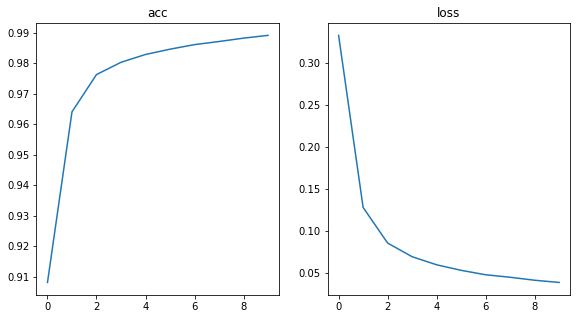

In [38]:
itensMetrics = ["acc", "loss"]
linhas = 1
colunas = 4
fig = plt.figure(figsize = (20,5))
for i in range(len(itensMetrics)):
    plt.subplot(linhas,colunas,i+1)
    plt.plot(hist.history[itensMetrics[i]])
    plt.title(itensMetrics[i])
plt.show()

## VGC16

In [40]:
modelVGC = VGG16()

modelVGC.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [41]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

print(X_test.shape)
print(y_test.shape)

X_test = X_test[:20]
y_test = y_test[:20]

print(X_test.shape)
print(y_test.shape)

(10000, 28, 28)
(10000,)
(20, 28, 28)
(20,)


In [42]:
newX_test = np.zeros((20, 224,224,3))
newX_test.shape
for i in range(20):
    resizeImg = cv.resize(X_test[i], (224,224), interpolation = cv.INTER_LINEAR)
    resizeImg = cv.cvtColor(resizeImg, cv.COLOR_GRAY2RGB)
    newX_test[i] = np.asarray(resizeImg).reshape(224, 224, 3)

In [43]:
newX_test.shape

(20, 224, 224, 3)

In [44]:
y_predict = modelVGC.predict(newX_test)
label = decode_predictions(y_predict)
j=0
for itemLabel in label:
    for (i, (imagenetID, label, prob)) in enumerate(itemLabel):
        print("{}. {}: {:.2f}%".format(i + 1, label, prob * 100))
    print ("-------- Valor real era: {}" . format(y_test[j]))
    j+=1

1. nematode: 24.58%
2. screw: 13.39%
3. nail: 9.79%
4. ballpoint: 4.52%
5. pick: 4.45%
-------- Valor real era: 7
1. nematode: 42.52%
2. screw: 10.62%
3. hook: 6.77%
4. pick: 4.86%
5. nail: 4.03%
-------- Valor real era: 2
1. nail: 47.02%
2. screw: 16.81%
3. ballpoint: 8.12%
4. letter_opener: 4.60%
5. nematode: 3.17%
-------- Valor real era: 1
1. bolo_tie: 5.03%
2. screw: 4.86%
3. pick: 3.82%
4. soccer_ball: 2.81%
5. hair_slide: 2.73%
-------- Valor real era: 0
1. nematode: 62.66%
2. nail: 8.06%
3. screw: 6.24%
4. hook: 3.35%
5. matchstick: 1.17%
-------- Valor real era: 4
1. screw: 24.59%
2. ballpoint: 22.01%
3. nail: 16.57%
4. screwdriver: 7.36%
5. syringe: 4.77%
-------- Valor real era: 1
1. nematode: 33.73%
2. screw: 12.93%
3. corkscrew: 10.77%
4. banded_gecko: 3.52%
5. nail: 3.43%
-------- Valor real era: 4
1. ballpoint: 17.00%
2. screw: 10.31%
3. nematode: 7.73%
4. corkscrew: 5.86%
5. chime: 4.84%
-------- Valor real era: 9
1. pick: 27.68%
2. screw: 20.49%
3. corkscrew: 11.74%
4.

# Problema das abelhas

(500, 500)


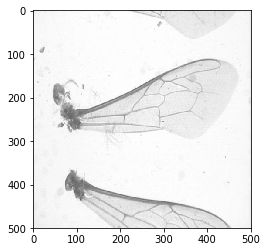

In [8]:
main_dir = "./"
wings_dir = "wings2"
path = os.path.join(main_dir,wings_dir)

# Percorre todos os arquivos do diretório
for p in os.listdir(path):
    # Categoria é obtida a partir do nome do arquivo
    category = p.split(" ")[0]
    
    img_array = cv.imread(os.path.join(path,p),cv.IMREAD_GRAYSCALE)
    new_img_array = cv.resize(img_array, dsize=(500, 500))
    plt.imshow(new_img_array,cmap="gray")
    break
print(new_img_array.shape)

In [9]:
X = []
y = []

def create_test_data(path):
    i = 0
    for p in os.listdir(path):
        try:
            category = p.split(" ")[0]
            img_array = cv.imread(os.path.join(path,p),cv.IMREAD_GRAYSCALE)
            new_img_array = cv.resize(img_array, dsize = (320, 320))
            #plt.imshow(new_img_array,cmap="gray")
            X.append(new_img_array)
            y.append(category)
        except Exception as e:
            print(str(os.path.join(path,p)))

In [10]:
# CARREGA OS DADOS
create_test_data(path)

print(np.array(X).shape)
print(np.array(y).shape)

X = np.array(X).reshape(-1, 320,320,1)
y = np.array(y)

print(np.array(X).shape)
print(np.array(y).shape)

./wings2/pwarpsminha.nts
./wings2/pwsubespecies.nts
./wings2/analise minha.TPS
./wings2/Erläuterung.txt
./wings2/landmarks.TPS
./wings2/morfogeosubesp.CSV
./wings2/aligned.nts
(1737, 320, 320)
(1737,)
(1737, 320, 320, 1)
(1737,)


In [11]:
le = preprocessing.LabelEncoder()
print(len(set(y)))
y_new = le.fit(y)
y_new = le.transform(y)
print(len(set(y_new)))
y_new = to_categorical(y_new)
print(y_new)

25
25
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y_new, test_size = 0.2) 

In [13]:
print(X_train.shape)
print(y_test.shape)

print(X_test.shape)
print(y_test.shape)

(1389, 320, 320, 1)
(348, 25)
(348, 320, 320, 1)
(348, 25)


In [14]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), activation = "relu", input_shape=(320, 320, 1)))
model.add(layers.MaxPooling2D((2,2)))

# Adicionar Achatamento
model.add(layers.Flatten())
model.add(layers.Dense(25, activation = "softmax"))

model.compile(optimizer = "adam", loss = "categorical_crossentropy", metrics = ["acc"])

In [15]:
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

In [40]:
time_callback = TimeHistory()
hist = model.fit(X_train, y_train, epochs = 15, batch_size = 16, callbacks = [time_callback])
print(sum(time_callback.times))

Train on 1389 samples
Epoch 1/15
1389/1389 [==============================] - 3s 2ms/sample - loss: 6839.3107 - acc: 0.0907
Epoch 2/15
1389/1389 [==============================] - 2s 2ms/sample - loss: 9.9163 - acc: 0.4060
Epoch 3/15
1389/1389 [==============================] - 2s 2ms/sample - loss: 2.2757 - acc: 0.6595
Epoch 4/15
1389/1389 [==============================] - 2s 2ms/sample - loss: 0.3424 - acc: 0.9273
Epoch 5/15
1389/1389 [==============================] - 2s 2ms/sample - loss: 0.1106 - acc: 0.9892
Epoch 6/15
1389/1389 [==============================] - 2s 2ms/sample - loss: 0.1051 - acc: 0.9885
Epoch 7/15
1389/1389 [==============================] - 2s 2ms/sample - loss: 0.0047 - acc: 0.9986
Epoch 8/15
1389/1389 [==============================] - 2s 2ms/sample - loss: 5.0094e-04 - acc: 1.0000
Epoch 9/15
1389/1389 [==============================] - 2s 2ms/sample - loss: 7.0115e-05 - acc: 1.0000
Epoch 10/15
1389/1389 [==============================] - 2s 2ms/sample - los

Text(0.5, 1.0, 'Acc: 1.0')

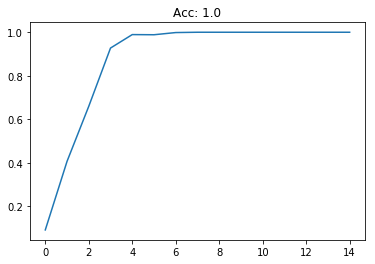

In [41]:
plt.plot(hist.history["acc"])
plt.title("Acc: " + str(max(hist.history["acc"]).round(4)))

Text(0.5, 1.0, 'Loss: 0.0')

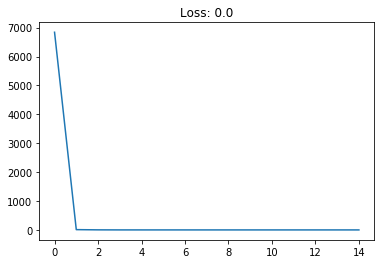

In [42]:
plt.plot(hist.history["loss"])
plt.title("Loss: " + str(min(hist.history["loss"]).round(4)))

## CPU

In [16]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), activation = "relu", input_shape=(320, 320, 1)))
model.add(layers.MaxPooling2D((2,2)))

# Adicionar Achatamento
model.add(layers.Flatten())
model.add(layers.Dense(25, activation = "softmax"))

model.compile(optimizer = "adam", loss = "categorical_crossentropy", metrics = ["acc"])

In [17]:
time_callback = TimeHistory()
hist = model.fit(X_train, y_train, epochs = 15, batch_size = 16, callbacks = [time_callback])
print(sum(time_callback.times))

Train on 1389 samples
Epoch 1/15
1389/1389 [==============================] - 24s 18ms/sample - loss: 16036.8898 - acc: 0.0504
Epoch 2/15
1389/1389 [==============================] - 24s 17ms/sample - loss: 47.3289 - acc: 0.5126
Epoch 3/15
1389/1389 [==============================] - 24s 18ms/sample - loss: 1.1630 - acc: 0.9280
Epoch 4/15
1389/1389 [==============================] - 24s 17ms/sample - loss: 0.1250 - acc: 0.9914
Epoch 5/15
1389/1389 [==============================] - 23s 17ms/sample - loss: 0.1897 - acc: 0.9849
Epoch 6/15
1389/1389 [==============================] - 23s 17ms/sample - loss: 0.0035 - acc: 0.9986
Epoch 7/15
1389/1389 [==============================] - 24s 17ms/sample - loss: 3.1156e-04 - acc: 1.0000
Epoch 8/15
1389/1389 [==============================] - 24s 17ms/sample - loss: 1.9566e-04 - acc: 1.0000
Epoch 9/15
1389/1389 [==============================] - 24s 17ms/sample - loss: 1.5021e-04 - acc: 1.0000
Epoch 10/15
1389/1389 [=============================

## GPU -> 34.40 segundos

## CPU -> 6 minutos